In [ ]:
!pip install pandas
!pip install bertopic numpy tqdm pandas gdown
!pip install --upgrade tqdm
!pip install --upgrade umap-learn
!pip install numpy
import sys
!{sys.executable} -m pip install bertopic umap-learn hdbscan tqdm pandas numpy gdown pyarrow seaborn
!pip install --upgrade pandas pyarrow fastparquet

In [ ]:
import gdown
import os

url = "https://drive.google.com/uc?id=1Wuq8GjDAXPRf0MELPROHPBaoNhTlC0Hb"

output_filename = 'embedded.db'
download_path = os.path.join(os.getcwd(), output_filename)

print(f"Attempting to download '{output_filename}' to: {download_path}")

if os.path.exists(download_path):
    print(f"Warning: File '{output_filename}' already exists. Skipping download.")
else:
    gdown.download(url, output=download_path, quiet=False)
    print(f"Download of '{output_filename}' complete!")

# confirm file
if os.path.exists(download_path):
    print(f"'{output_filename}' found locally at {download_path}")

# Confirm file presence and size
if os.path.exists(download_path):
    file_size_bytes = os.path.getsize(download_path)
    file_size_gb = file_size_bytes / (1024**3)
    print(f"'{output_filename}' found locally. Size: {file_size_gb:.2f} GB")
    if file_size_gb < 1:
        print("Warning: Downloaded file size seems unusually small. Check if download was complete/successful.")
else:
    print("ERROR: Downloaded file not found after gdown command.")
    raise FileNotFoundError(f"Download target {download_path} not found.")

VAST_AI_DB_PATH = download_path
print(f"VAST_AI_DB_PATH set to: {VAST_AI_DB_PATH}")

Attempting to download 'embedded.db' to: /embedded.db
'embedded.db' found locally at /embedded.db
'embedded.db' found locally. Size: 17.16 GB
VAST_AI_DB_PATH set to: /embedded.db


In [ ]:
import os
import sys
import sqlite3
import numpy as np
import json
import random
from bertopic import BERTopic
from tqdm.notebook import tqdm
import pandas as pd
import gc
import umap
from hdbscan import HDBSCAN   # ✅ standard HDBSCAN

# --- Configuration ---
LOCAL_DB_FILENAME = 'embedded.db'
BERTOPIC_MODEL_SAVE_PATH = './bertopic_model_safetensors'
TABLE_NAME = 'embeddings'
TEXT_COLUMN = 'textOriginal'
EMBEDDING_COLUMN = 'embedding'
SAMPLE_SIZE = 100000
RANDOM_SEED = 42
# --- End Configuration ---

# --- Step 0: Verify Database Presence ---
print("\n--- Step 0: Verifying Database Presence ---")
db_path_for_loading = os.path.join(os.getcwd(), LOCAL_DB_FILENAME)

if not os.path.exists(db_path_for_loading):
    print(f"ERROR: Database file '{LOCAL_DB_FILENAME}' NOT FOUND at: '{db_path_for_loading}'")
    raise FileNotFoundError(f"Database file {LOCAL_DB_FILENAME} not found.")
else:
    file_size_bytes = os.path.getsize(db_path_for_loading)
    file_size_gb = file_size_bytes / (1024**3)
    print(f"Database file '{LOCAL_DB_FILENAME}' found at '{db_path_for_loading}'. Size: {file_size_gb:.2f} GB")
    if file_size_gb < 15:
        print("CRITICAL WARNING: Database file size seems unusually small. It might be incomplete.")
print("--- End Database Verification Step ---")

# --- Step 1: Load Embeddings and Original Text from embedded.db (with Sampling) ---
print("\n--- Step 1: Loading Data from Database (with Sampling) ---")
print(f"Attempting to connect to database: '{db_path_for_loading}'")
try:
    conn = sqlite3.connect(db_path_for_loading)
    cursor = conn.cursor()
    print("Database connection established. Starting fetch, this is a single blocking call and does not have a progress bar.")
except sqlite3.Error as e:
    print(f"ERROR: Could not connect to database at '{db_path_for_loading}': {e}")
    raise

query = f"""
SELECT commentId, {TEXT_COLUMN}, {EMBEDDING_COLUMN}, publishedAt, likeCount
FROM {TABLE_NAME}
ORDER BY commentId ASC;
"""

try:
    results_all = cursor.execute(query).fetchall()
except sqlite3.Error as e:
    print(f"ERROR: SQLite query failed: {e}")
    conn.close()
    raise
finally:
    conn.close()
print(f"Finished fetching {len(results_all)} total rows from the database.")

# --- Data Sampling ---
if SAMPLE_SIZE and SAMPLE_SIZE > 0 and SAMPLE_SIZE < len(results_all):
    print(f"\nApplying random sampling: Selecting {SAMPLE_SIZE} documents from {len(results_all)} total.")
    random.seed(RANDOM_SEED)
    results_for_bertopic = random.sample(results_all, SAMPLE_SIZE)
    print(f"Sampled {len(results_for_bertopic)} documents for BERTopic training.")
else:
    print("\nNo sampling applied (or sample size invalid/equal to total). Using the entire dataset.")
    results_for_bertopic = results_all

if 'results_all' in locals() and SAMPLE_SIZE and SAMPLE_SIZE < len(results_all):
    del results_all
    gc.collect()
    print("Memory from full dataset results_all released.")

# --- Deserialize embeddings ---
comment_ids = []
documents = []
embeddings_list = []
timestamps = []
like_counts = []
parsed_count = 0
skipped_count = 0

print("Starting deserialization of embeddings. This has a progress bar:")
for cid, text, embedding_text_str, pub_date, like_count in tqdm(results_for_bertopic, desc="Processing embeddings"):
    if text is not None and embedding_text_str is not None:
        comment_ids.append(cid)
        documents.append(text)
        timestamps.append(pub_date)
        like_counts.append(like_count)
        try:
            embedding_array = np.array(json.loads(embedding_text_str), dtype=np.float32)
            embeddings_list.append(embedding_array)
            parsed_count += 1
        except (json.JSONDecodeError, ValueError):
            skipped_count += 1
            continue
    else:
        skipped_count += 1

if embeddings_list:
    embeddings = np.array(embeddings_list, dtype=np.float32)
else:
    embeddings = np.array([], dtype=np.float32)

print(f"\nDeserialization complete. Parsed {parsed_count} embeddings, skipped {skipped_count}.")
if embeddings.size > 0:
    print(f"Resulting embeddings array shape: {embeddings.shape}")
else:
    print("No embeddings were successfully loaded. BERTopic cannot proceed.")
    raise ValueError("No embeddings loaded, cannot proceed with BERTopic.")

# --- Convert timestamps ---
timestamps = pd.to_datetime(timestamps, errors="coerce")
print(f"First 5 parsed timestamps: {timestamps[:5]}")
print("--- End Data Loading Step ---")
print("-" * 50)

# --- Step 2: BERTopic Model Training ---
print("\n--- Step 2: BERTopic Model Training ---")
print("Initializing BERTopic model...")

umap_model = umap.UMAP(
    n_neighbors=15,
    n_components=5,
    min_dist=0.0,
    metric='cosine',
    random_state=RANDOM_SEED
)

hdbscan_model = HDBSCAN(
    min_cluster_size=10,
    metric='euclidean',
    prediction_data=True,
    gen_min_span_tree=True,
    core_dist_n_jobs=1
)

topic_model = BERTopic(
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    verbose=True
)

print("BERTopic model initialized.")
print("\nStarting BERTopic model training...")

try:
    topics, probs = topic_model.fit_transform(documents, embeddings=embeddings)
except MemoryError:
    print("ERROR: MemoryError during BERTopic training. Your instance likely ran out of RAM.")
    raise
except Exception as e:
    print(f"ERROR: An unexpected error occurred during BERTopic training: {e}")
    raise

print("\nBERTopic training complete!")

topic_info = topic_model.get_topic_info()
print("\n--- Topic Information (top 10) ---")
print(topic_info.head(10))

if len(topic_info) > 1 and topic_info.iloc[0]['Topic'] == -1 and len(topic_info) > 2:
    print("\n--- Top words for Topic 0 (most frequent actual topic) ---")
    print(topic_model.get_topic(0))
elif len(topic_info) > 1 and topic_info.iloc[0]['Topic'] != -1:
    print("\n--- Top words for Topic 0 (most frequent topic) ---")
    print(topic_model.get_topic(0))
else:
    print("\nNo significant topics found besides potential outliers (-1) or not enough topics.")

print("-" * 50)

# --- Step 3: Save Model ---
print("\n--- Step 3: Saving the Model ---")
print(f"Saving BERTopic model to: '{BERTOPIC_MODEL_SAVE_PATH}'. This is a single blocking call and does not have a progress bar.")
try:
    topic_model.save(BERTOPIC_MODEL_SAVE_PATH, serialization="safetensors")
    print(f"BERTopic model saved successfully to '{BERTOPIC_MODEL_SAVE_PATH}'.")
except Exception as e:
    print(f"ERROR: Could not save BERTopic model to '{BERTOPIC_MODEL_SAVE_PATH}': {e}")
    print("Ensure the directory exists and you have write permissions.")
print("--- End Model Saving Step ---")



--- Step 0: Verifying Database Presence ---
Database file 'embedded.db' found at '/embedded.db'. Size: 17.16 GB
--- End Database Verification Step ---

--- Step 1: Loading Data from Database (with Sampling) ---
Attempting to connect to database: '/embedded.db'
Database connection established. Starting fetch, this is a single blocking call and does not have a progress bar.
Finished fetching 868837 total rows from the database.

Applying random sampling: Selecting 100000 documents from 868837 total.
Sampled 100000 documents for BERTopic training.
Memory from full dataset results_all released.
Starting deserialization of embeddings. This has a progress bar:


Processing embeddings:   0%|          | 0/100000 [00:00<?, ?it/s]


Deserialization complete. Parsed 100000 embeddings, skipped 0.
Resulting embeddings array shape: (100000, 1024)
First 5 parsed timestamps: DatetimeIndex(['2021-02-05 10:31:47+00:00', '2022-02-26 21:04:24+00:00',
               '2023-10-25 02:34:39+00:00', '2023-06-27 09:58:35+00:00',
               '2024-12-28 00:25:55+00:00'],
              dtype='datetime64[ns, UTC]', freq=None)
--- End Data Loading Step ---
--------------------------------------------------

--- Step 2: BERTopic Model Training ---
Initializing BERTopic model...
BERTopic model initialized.

Starting BERTopic model training...


2025-09-10 10:00:59,759 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-09-10 10:04:58,312 - BERTopic - Dimensionality - Completed ✓
2025-09-10 10:04:58,318 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-09-10 10:05:08,344 - BERTopic - Cluster - Completed ✓
2025-09-10 10:05:08,373 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-09-10 10:05:10,651 - BERTopic - Representation - Completed ✓



BERTopic training complete!

--- Topic Information (top 10) ---
   Topic  Count                             Name  \
0     -1  39238           -1_hair_would_see_make   
1      0    984                0_ye_bal_kya_nahi   
2      1    739  1_beautiful_usual_eras_glorious   
3      2    650               2_bina_ke_aap_itna   
4      3    549          3_nice_preach_demure_dp   
5      4    482         4_india_bast_bharat_besr   
6      5    474                5_aku_nya_itu_kak   
7      6    423     6_looked_look_better_looking   
8      7    420         7_love_unfiltered_jou_ot   
9      8    418                    8_wow_shook__   

                                      Representation  \
0  [hair, would, see, make, think, know, dont, ev...   
1  [ye, bal, kya, nahi, bhi, ko, nhi, ho, kar, kuch]   
2  [beautiful, usual, eras, glorious, regardless,...   
3  [bina, ke, aap, itna, karna, ho, bhi, bahut, m...   
4  [nice, preach, demure, dp, nicer, gal, pic, , , ]   
5  [india, bast, bharat, b

In [ ]:
import pandas as pd

# Put your results into a DataFrame
df_results = pd.DataFrame({"Document": documents, "Topic": topics})

# Count outliers (-1) vs clustered topics
outlier_count = (df_results["Topic"] == -1).sum()
total_count = len(df_results)
outlier_percentage = outlier_count / total_count * 100

print(f"Outliers: {outlier_count}/{total_count} ({outlier_percentage:.2f}%)")


Outliers: 39238/100000 (39.24%)


In [ ]:
def topic_diversity(topics, top_k=10):
    """
    Calculate topic diversity:
    ratio of unique words to total words across all topics.
    """
    unique_words = set()
    total_words = 0

    for topic_words in topics.values():
        if topic_words:  # skip empty
            words = [word for word, _ in topic_words[:top_k]]
            unique_words.update(words)
            total_words += len(words)

    return len(unique_words) / total_words if total_words > 0 else 0.0


# Use it on your model
diversity = topic_diversity(topic_model.get_topics(), top_k=10)
print(f"Topic Diversity: {diversity:.4f}")


Topic Diversity: 0.6628


In [ ]:
import sys
print(sys.executable)
!{sys.executable} -m pip install matplotlib

/venv/main/bin/python


   Topic  Count                             Name  \
0     -1  39238           -1_hair_would_see_make   
1      0    984                0_ye_bal_kya_nahi   
2      1    739  1_beautiful_usual_eras_glorious   
3      2    650               2_bina_ke_aap_itna   
4      3    549          3_nice_preach_demure_dp   
5      4    482         4_india_bast_bharat_besr   
6      5    474                5_aku_nya_itu_kak   
7      6    423     6_looked_look_better_looking   
8      7    420         7_love_unfiltered_jou_ot   
9      8    418                    8_wow_shook__   

                                      Representation  \
0  [hair, would, see, make, think, know, dont, ev...   
1  [ye, bal, kya, nahi, bhi, ko, nhi, ho, kar, kuch]   
2  [beautiful, usual, eras, glorious, regardless,...   
3  [bina, ke, aap, itna, karna, ho, bhi, bahut, m...   
4  [nice, preach, demure, dp, nicer, gal, pic, , , ]   
5  [india, bast, bharat, besr, obeslay, walla, in...   
6  [aku, nya, itu, kak, sama, yg, y

<Axes: title={'center': 'Topic Sizes'}, xlabel='Topic'>

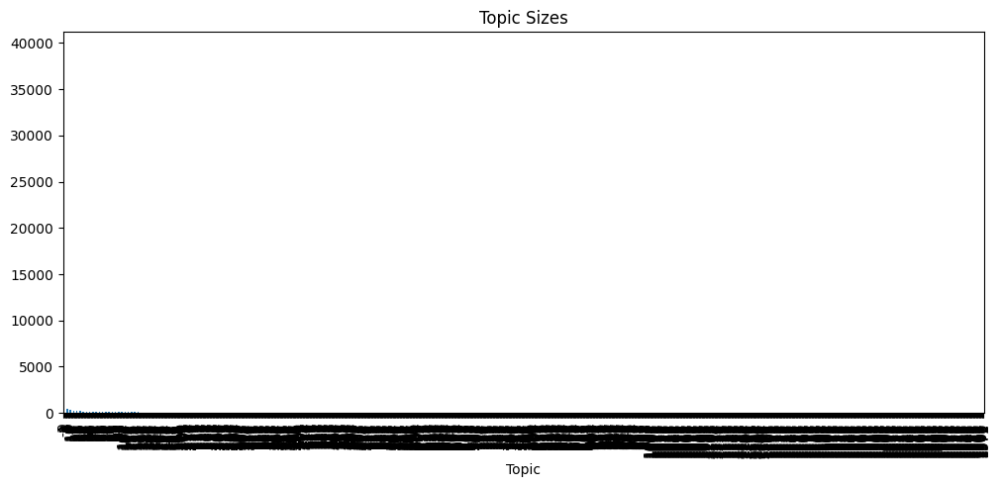

In [ ]:
topic_info = topic_model.get_topic_info()
print(topic_info.head(10))  # top 10 topics

topic_info.set_index("Topic")["Count"].plot(
    kind="bar", figsize=(12,5), title="Topic Sizes"
)

In [ ]:
# --- Step 4: Topics Over Time ---
print("\n--- Step 4: Topics Over Time ---")

# Convert collected timestamps (list of strings) to datetime
timestamps = pd.to_datetime(timestamps, errors='coerce')

# Bin them to monthly periods to drastically reduce the number of unique timestamps
timestamps_binned = timestamps.to_period("M").to_timestamp()

# Call topics_over_time with a smaller number of bins
topics_over_time = topic_model.topics_over_time(
    documents,
    timestamps_binned,
    nr_bins=30
)

# Visualize the evolution
topic_model.visualize_topics_over_time(topics_over_time)



--- Step 4: Topics Over Time ---


30it [00:48,  1.60s/it]


ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hoverinfo': 'text',
              'hovertext': [<b>Topic 0</b><br>Words: aahe, knw, devicha, chutiye,
                            bakcod, <b>Topic 0</b><br>Words: kum, rehtaaaaa,
                            alekum, qemit, aniskabhartijeetubablihitlikesforaniska,
                            <b>Topic 0</b><br>Words: staright, shdi, jan, mari,
                            bal, <b>Topic 0</b><br>Words: bahay, bistita, dehti,
                            hojate, haftay, <b>Topic 0</b><br>Words: kainat,
                            parhte, namaz, aase, tariq, <b>Topic 0</b><br>Words:
                            dedho, kanjoosi, palat, kaisi, garden, <b>Topic
                            0</b><br>Words: badli, mukupe, allahye, khete,
                            mainebandi, <b>Topic 0</b><br>Words: lagana, kahani,
                            voh, yaar, ajeeb, <b>Topic 0</b><br>Words: hina, maaro,
                            wakt, paray, larkiyo, <b>Topic 0</b><br>Words: ladko,
                            kabhi, rasam, ankh, mecap, <b>Topic 0</b><br>Words:
                            break, avneet, badal, chapri, diye, <b>Topic
                            0</b><br>Words: sivangi, iye, chota, haan, mone,
                            <b>Topic 0</b><br>Words: oye, inhe, badal, ali, kajol,
                            <b>Topic 0</b><br>Words: sbhi, itani, jinta, khudpe,
                            ladky, <b>Topic 0</b><br>Words: hoon, bacche, dimaag,
                            mosturijer, lagane, <b>Topic 0</b><br>Words: kiran,
                            lekhin, beten, sukti, kheechke, <b>Topic
                            0</b><br>Words: vishay, sal, nahi, bandar, baat,
                            <b>Topic 0</b><br>Words: jis, sony, cast, hamari, ye,
                            <b>Topic 0</b><br>Words: rahe, dikhri, soye, bolne,
                            karate, <b>Topic 0</b><br>Words: bal, kab, khud, krta,
                            mojja, <b>Topic 0</b><br>Words: nay, aara, bahr, nhi,
                            seedha, <b>Topic 0</b><br>Words: onk, nahakr, jda,
                            jaao, thand, <b>Topic 0</b><br>Words: bachha, bulaya,
                            nuvv, meckup, dekh, <b>Topic 0</b><br>Words: tak, taka,
                            chhu, gore, koi, <b>Topic 0</b><br>Words: socha, bajti,
                            jejemaa, jhia, tha, <b>Topic 0</b><br>Words: unka, vah,
                            puchha, gorapan, chala, <b>Topic 0</b><br>Words:
                            mashllha, bolne, mkup, kahani, bolti, <b>Topic
                            0</b><br>Words: jhooth, mojhe, kaun, tere, mazak,
                            <b>Topic 0</b><br>Words: chhote, bevkuf, hain, pata,
                            ham, <b>Topic 0</b><br>Words: rahul, tumko, wajan,
                            pichke, kamini],
              'marker': {'color': '#E69F00'},
              'mode': 'lines',
              'name': '0_ye_bal_kya_nahi',
              'type': 'scatter',
              'x': array(['2019-12-29T23:48:28.800000000', '2020-03-07T22:24:00.000000000',
                          '2020-05-13T20:48:00.000000000', '2020-07-19T19:12:00.000000000',
                          '2020-09-24T17:36:00.000000000', '2020-11-30T16:00:00.000000000',
                          '2021-02-05T14:24:00.000000000', '2021-04-13T12:48:00.000000000',
                          '2021-06-19T11:12:00.000000000', '2021-08-25T09:36:00.000000000',
                          '2021-10-31T08:00:00.000000000', '2022-01-06T06:24:00.000000000',
                          '2022-03-14T04:48:00.000000000', '2022-05-20T03:12:00.000000000',
                          '2022-07-26T01:36:00.000000000', '2022-10-01T00:00:00.000000000',
                          '2022-12-06T22:24:00.000000000', '2023-02-11T20:48:00.000000000',
                          '2023-04-19T19:12:00.000000000', '2023-06-25T17:36:00.000000000',
                          '2023-08-31T16:00:00

In [ ]:
print("\n--- Saving BERTopic Model and Processed Data for Next Steps ---")

# Save to the current working directory
output_dir = os.getcwd()  # this is the folder where your .ipynb is running
print(f"Files will be saved in: {output_dir}")

# Build the consolidated DataFrame
df_processed_data = pd.DataFrame({
    'commentId': comment_ids,
    'textOriginal': documents,
    'topic': topics,
    'topic_probability': probs,
    'publishedAt': timestamps,
    'likeCount': like_counts
})

# Save the consolidated DataFrame to Parquet (fast for large data)
df_processed_data_path = os.path.join(output_dir, 'bertopic_processed_data.parquet')
df_processed_data.to_parquet(df_processed_data_path, index=False)
print(f"Consolidated DataFrame saved to '{df_processed_data_path}'.")

# Save the topic_info DataFrame separately
topic_info_path = os.path.join(output_dir, 'bertopic_topic_info.csv')
topic_model.get_topic_info().to_csv(topic_info_path, index=False)
print(f"Topic information (topic_info.csv) saved to '{topic_info_path}'.")

# Save the BERTopic model itself (already trained)
model_save_path = os.path.join(output_dir, 'bertopic_model_safetensors')
topic_model.save(model_save_path, serialization="safetensors")
print(f"BERTopic model saved successfully to '{model_save_path}'.")

print("\nAll BERTopic results and processed data saved.")
print("In your new notebook, you can load:")
print("  • The model from", model_save_path)
print("  • The processed data from", df_processed_data_path)



--- Saving BERTopic Model and Processed Data for Next Steps ---
Files will be saved in: /
Consolidated DataFrame saved to '/bertopic_processed_data.parquet'.
Topic information (topic_info.csv) saved to '/bertopic_topic_info.csv'.
BERTopic model saved successfully to '/bertopic_model_safetensors'.

All BERTopic results and processed data saved.
In your new notebook, you can load:
  • The model from /bertopic_model_safetensors
  • The processed data from /bertopic_processed_data.parquet


--- Step 3: Temporal Analysis ---
Loading processed data from '/bertopic_processed_data.parquet'...
Data loaded successfully.
DataFrame shape: (100000, 6)
  commentId                                       textOriginal  topic  \
0   4281848                                               cute     10   
1   1570639                    see great invention except isnt    274   
2   1128963  cant believe stunningly gorge amazingly super ...     -1   
3    553317                                    subscribe spoon    111   
4   2407520     cual es la diferencia yo los veo todos iguales     12   

   topic_probability               publishedAt  likeCount  
0           0.788620 2021-02-05 10:31:47+00:00          0  
1           0.678416 2022-02-26 21:04:24+00:00          0  
2           0.000000 2023-10-25 02:34:39+00:00          1  
3           0.471693 2023-06-27 09:58:35+00:00          0  
4           0.785546 2024-12-28 00:25:55+00:00          0  

Topic Info (first 5):
   Topic  Count        

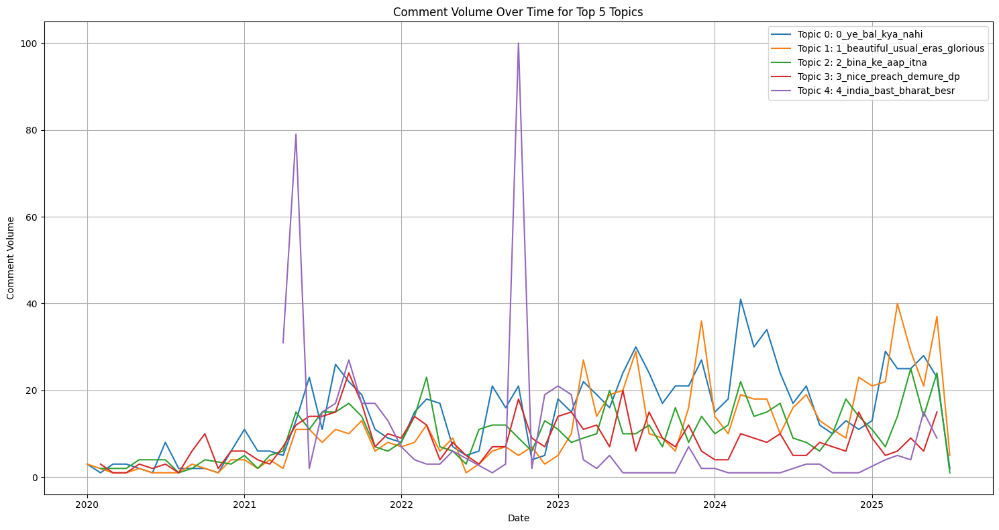

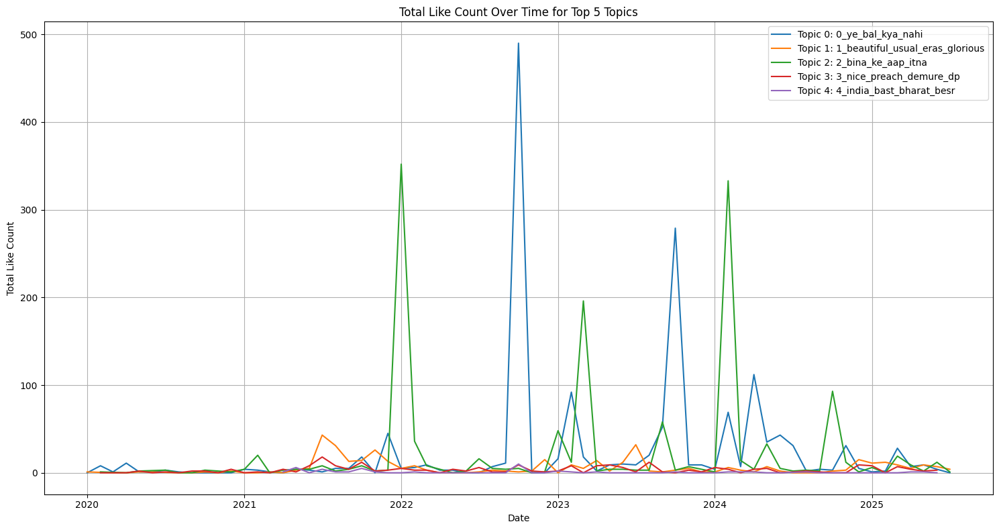

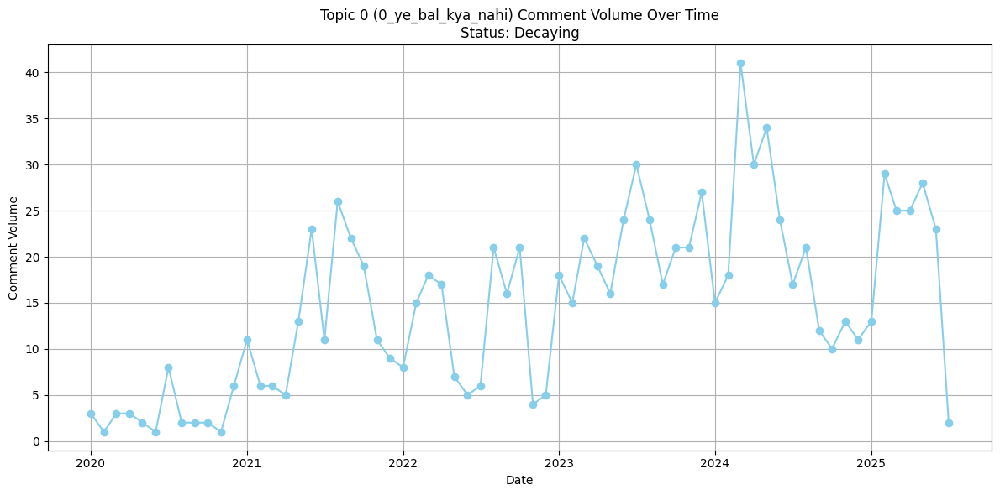

In [ ]:
# --- Temporal Analysis ---
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Save/load from the current Jupyter working directory
output_dir = os.getcwd()  # same folder as this notebook by default
df_processed_data_path = os.path.join(output_dir, 'bertopic_processed_data.parquet')
topic_info_path = os.path.join(output_dir, 'bertopic_topic_info.csv')

# --- Load Data ---
print("--- Step 3: Temporal Analysis ---")
print(f"Loading processed data from '{df_processed_data_path}'...")

try:
    df = pd.read_parquet(df_processed_data_path)
    topic_info = pd.read_csv(topic_info_path)
    print("Data loaded successfully.")
    print(f"DataFrame shape: {df.shape}")
    print(df.head())
    print("\nTopic Info (first 5):")
    print(topic_info.head())
except FileNotFoundError as e:
    print(f"ERROR: Could not find '{e.filename}'. Please ensure the path is correct and the file exists.")
    raise
except Exception as e:
    print(f"ERROR: An unexpected error occurred while loading data: {e}")
    raise

# Ensure 'publishedAt' is datetime type
df['publishedAt'] = pd.to_datetime(df['publishedAt'], errors='coerce')
df.dropna(subset=['publishedAt'], inplace=True)

# Add a 'month' column for easier aggregation
df['month'] = df['publishedAt'].dt.to_period('M')

# Merge topic names into the main DataFrame
topic_info_dict = topic_info.set_index('Topic')['Name'].to_dict()
df['topic_name'] = df['topic'].map(topic_info_dict)

# Filter out the -1 topic (outliers)
df_filtered = df[df['topic'] != -1].copy()

# --- Aggregate data by topic and time ---
print("\n--- Aggregating data by topic and time ---")
temporal_analysis_df = df_filtered.groupby(['topic', 'topic_name', 'month']).agg(
    comment_volume=('commentId', 'count'),
    total_like_count=('likeCount', 'sum')
).reset_index()

temporal_analysis_df['month_start'] = temporal_analysis_df['month'].dt.to_timestamp()
temporal_analysis_df.sort_values(by=['topic', 'month_start'], inplace=True)

print("\nTemporal Aggregation (first 10 rows):")
print(temporal_analysis_df.head(10))

# --- Define Trend Status Function ---
def assign_trend_status(series, window=3, threshold_emerging=0.5, threshold_decaying=-0.3, min_established_volume=50):
    if series.empty:
        return 'Stable'
    latest_volume = series.iloc[-1]
    rolling_avg = series.rolling(window=window, min_periods=1).mean().iloc[-1]
    prev_rolling_avg = series.rolling(window=window, min_periods=1).mean().iloc[-2] if len(series) >= 2 else series.iloc[0]

    if prev_rolling_avg == 0:
        if latest_volume > 0 and rolling_avg > 0:
             return 'Emerging'
        else:
             return 'Stable'

    percent_change = (rolling_avg - prev_rolling_avg) / prev_rolling_avg

    if percent_change > threshold_emerging and latest_volume > 0 and latest_volume > series.mean():
        if series.iloc[:-window].mean() < (series.mean() / 2):
            return 'Emerging'

    if percent_change < threshold_decaying and latest_volume < series.mean():
        return 'Decaying'

    overall_mean_volume = series.mean()
    if rolling_avg >= min_established_volume and -0.1 < percent_change < 0.1:
         return 'Established'

    return 'Stable'

# Assign trend status per topic
trend_statuses = {}
for topic_id, group in temporal_analysis_df.groupby('topic'):
    trend_statuses[topic_id] = assign_trend_status(group['comment_volume'])

# Topic summary with trend statuses
topic_summary = temporal_analysis_df.groupby(['topic', 'topic_name']).agg(
    total_volume=('comment_volume', 'sum'),
    average_monthly_volume=('comment_volume', 'mean'),
    max_monthly_volume=('comment_volume', 'max'),
    total_likes=('total_like_count', 'sum')
).reset_index()

topic_summary['trend_status'] = topic_summary['topic'].map(trend_statuses)
print("\nTopic Summary with Trend Statuses:")
print(topic_summary.sort_values(by='total_volume', ascending=False).head(10))

# --- Visualization ---
print("\n--- Visualizing Trends Over Time ---")

# Top 5 topics by total volume
top_n_topics = topic_summary.sort_values(by='total_volume', ascending=False).head(5)['topic'].tolist()
top_n_topic_names = topic_summary[topic_summary['topic'].isin(top_n_topics)].set_index('topic')['topic_name'].to_dict()

plt.figure(figsize=(15, 8))
for topic_id in top_n_topics:
    topic_data = temporal_analysis_df[temporal_analysis_df['topic'] == topic_id]
    plt.plot(topic_data['month_start'], topic_data['comment_volume'],
             label=f"Topic {topic_id}: {top_n_topic_names.get(topic_id, 'Unknown')}")
plt.title('Comment Volume Over Time for Top 5 Topics')
plt.xlabel('Date')
plt.ylabel('Comment Volume')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

plt.figure(figsize=(15, 8))
for topic_id in top_n_topics:
    topic_data = temporal_analysis_df[temporal_analysis_df['topic'] == topic_id]
    plt.plot(topic_data['month_start'], topic_data['total_like_count'],
             label=f"Topic {topic_id}: {top_n_topic_names.get(topic_id, 'Unknown')}")
plt.title('Total Like Count Over Time for Top 5 Topics')
plt.xlabel('Date')
plt.ylabel('Total Like Count')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Example topic plot with its status
example_topic_id = top_n_topics[0]
example_topic_data = temporal_analysis_df[temporal_analysis_df['topic'] == example_topic_id]
status = trend_statuses.get(example_topic_id, 'N/A')

plt.figure(figsize=(12, 6))
plt.plot(example_topic_data['month_start'], example_topic_data['comment_volume'],
         marker='o', linestyle='-', color='skyblue')
plt.title(f'Topic {example_topic_id} ({top_n_topic_names.get(example_topic_id, "Unknown")}) Comment Volume Over Time\nStatus: {status}')
plt.xlabel('Date')
plt.ylabel('Comment Volume')
plt.grid(True)
plt.tight_layout()
plt.show()
